In [1]:
!pip install torch

In [2]:
import torch
torch.cuda.is_available()

True

In [3]:
import zipfile
import os
from IPython.display import display
from PIL import Image

In [4]:
try:
    from ultralytics import YOLO
except:
    !pip install ultralytics
    from ultralytics import YOLO

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.5/660.5 kB 4.0 MB/s eta 0:00:00


In [5]:
!curl -L "https://app.roboflow.com/ds/3N2nm6FqDM?key=4yp5OWCWzd" --output roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   894  100   894    0     0   1695      0 --:--:-- --:--:-- --:--:--  1693
100 36.5M  100 36.5M    0     0  30.5M      0  0:00:01  0:00:01 --:--:--  345M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/20231009_132947_jpg.rf.be0ad1a865cb92c1389a0a9922832661.jpg  
 extracting: test/images/20231009_133003_jpg.rf.62b21c5081ed1f044707effd647ddcb9.jpg  
 extracting: test/images/20231009_133120_jpg.rf.f6c39d6a2cd871002ea06af3900ea340.jpg  
 extracting: test/images/20231009_133211_jpg.rf.0b6c6ea49b867dd15bd2ba3b9c9508d5.jpg  
 extracting: test/images/20231009_133237_jpg.rf.cf84b96247ee7ce6b8811ce42311e4bb.jpg  
 extracting: test/images/20231009_133300_jpg.rf.637669687fe5e0f5be9

In [6]:
yolo = YOLO('yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 87.6MB/s]


In [7]:
os.listdir()

['.config',
 'README.roboflow.txt',
 'yolov8n.pt',
 'valid',
 'README.dataset.txt',
 'test',
 'data.yaml',
 'yolo_bound.zip',
 'train',
 'sample_data']

In [8]:
yolo.train(data="data.yaml", epochs=40)

Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=40, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=Fals

100%|██████████| 755k/755k [00:00<00:00, 16.5MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/train/labels... 849 images, 408 backgrounds, 0 corrupt: 100%|██████████| 849/849 [00:00<00:00, 2290.94it/s]

train: New cache created: /content/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/valid/labels... 81 images, 39 backgrounds, 0 corrupt: 100%|██████████| 81/81 [00:00<00:00, 1321.11it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      3.53G      2.019      3.193      1.287         18        640: 100%|██████████| 54/54 [00:27<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.29it/s]

                   all         81       1227      0.185      0.522      0.235      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      3.47G      1.971      2.239      1.233         35        640: 100%|██████████| 54/54 [00:25<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.53it/s]

                   all         81       1227      0.376      0.236      0.287      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      4.17G      1.873      2.652       1.22          0        640: 100%|██████████| 54/54 [00:21<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

                   all         81       1227       0.24      0.241      0.174     0.0898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      3.16G      1.881      2.021      1.226          9        640: 100%|██████████| 54/54 [00:19<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         81       1227      0.469      0.447      0.453      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      3.03G      1.842      1.866       1.21         19        640: 100%|██████████| 54/54 [00:21<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         81       1227      0.421      0.426      0.395      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      3.02G      1.824      2.105      1.232          1        640: 100%|██████████| 54/54 [00:20<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.51it/s]

                   all         81       1227      0.506       0.51       0.51      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      3.57G      1.788      1.742      1.203         18        640: 100%|██████████| 54/54 [00:22<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all         81       1227      0.593      0.501      0.521      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      3.43G      1.758      1.725       1.18         38        640: 100%|██████████| 54/54 [00:21<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]

                   all         81       1227      0.525      0.482      0.495      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      2.62G      1.707      1.654       1.17         16        640: 100%|██████████| 54/54 [00:19<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         81       1227      0.566      0.593      0.582      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      2.95G      1.757      1.625      1.181         12        640: 100%|██████████| 54/54 [00:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         81       1227      0.516      0.552       0.52      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      3.17G      1.712      1.558      1.179         13        640: 100%|██████████| 54/54 [00:20<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all         81       1227      0.621       0.61      0.634      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      2.64G      1.712       1.55      1.168         13        640: 100%|██████████| 54/54 [00:20<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         81       1227      0.679      0.635      0.673      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      2.97G      1.731      1.508      1.182         14        640: 100%|██████████| 54/54 [00:21<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         81       1227      0.636      0.532      0.594       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      3.49G      1.717      1.523      1.189         10        640: 100%|██████████| 54/54 [00:19<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         81       1227      0.576      0.631      0.613      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      3.27G      1.674      1.458      1.167         16        640: 100%|██████████| 54/54 [00:20<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all         81       1227      0.666      0.672      0.692      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      3.56G      1.732      1.483      1.194         21        640: 100%|██████████| 54/54 [00:20<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

                   all         81       1227       0.66       0.64      0.668      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      2.62G       1.67      1.402      1.148         91        640: 100%|██████████| 54/54 [00:20<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         81       1227      0.623      0.691       0.67      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      3.19G      1.645      1.382      1.147         10        640: 100%|██████████| 54/54 [00:21<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all         81       1227      0.685      0.646      0.675       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      3.17G       1.68      1.358      1.155         43        640: 100%|██████████| 54/54 [00:20<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

                   all         81       1227      0.741       0.67       0.72      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      3.18G      1.645      1.366      1.149         56        640: 100%|██████████| 54/54 [00:20<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         81       1227       0.67      0.668      0.691       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      3.11G      1.611      1.298      1.139         41        640: 100%|██████████| 54/54 [00:21<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all         81       1227      0.711      0.681      0.728      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40       3.6G        1.6      1.289      1.124         19        640: 100%|██████████| 54/54 [00:19<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         81       1227      0.736      0.665      0.712      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      3.06G      1.608      1.287      1.145         22        640: 100%|██████████| 54/54 [00:21<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         81       1227      0.717      0.732      0.743      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      3.25G      1.594      1.284      1.128          6        640: 100%|██████████| 54/54 [00:19<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         81       1227      0.741      0.717      0.743      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      3.34G      1.562      1.227      1.135         25        640: 100%|██████████| 54/54 [00:21<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all         81       1227      0.759      0.693      0.734      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      3.08G      1.534       1.56       1.08          0        640: 100%|██████████| 54/54 [00:20<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]

                   all         81       1227      0.826      0.669      0.758       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      3.58G      1.573      1.269      1.118          5        640: 100%|██████████| 54/54 [00:20<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]

                   all         81       1227       0.77      0.696      0.747      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      2.92G      1.552      1.644      1.099          2        640: 100%|██████████| 54/54 [00:23<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all         81       1227      0.714      0.705      0.741      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      3.64G      1.536      1.199      1.112         17        640: 100%|██████████| 54/54 [00:19<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all         81       1227      0.736       0.68      0.745      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      2.67G      1.522       1.46      1.104          0        640: 100%|██████████| 54/54 [00:20<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.28it/s]

                   all         81       1227      0.725      0.579      0.673      0.442


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      3.44G      1.545      1.168      1.131         14        640: 100%|██████████| 54/54 [00:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]

                   all         81       1227      0.741      0.697      0.745      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      3.12G      1.517      1.122      1.128         15        640: 100%|██████████| 54/54 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all         81       1227      0.804      0.725      0.787      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      3.01G      1.507        1.1      1.114         28        640: 100%|██████████| 54/54 [00:18<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

                   all         81       1227      0.791      0.752      0.787      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40       2.8G       1.49      1.342      1.112          0        640: 100%|██████████| 54/54 [00:18<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         81       1227      0.795      0.679       0.76      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      2.94G      1.516      1.118      1.142         34        640: 100%|██████████| 54/54 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all         81       1227      0.752      0.737      0.768      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      3.35G      1.448      1.234      1.087          0        640: 100%|██████████| 54/54 [00:18<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all         81       1227      0.795      0.732      0.789      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      2.94G      1.449      1.099      1.089          0        640: 100%|██████████| 54/54 [00:17<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all         81       1227      0.793      0.733      0.799      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      3.02G      1.441       1.03      1.093         15        640: 100%|██████████| 54/54 [00:19<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         81       1227      0.809      0.719      0.789      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      3.38G      1.429      1.062      1.081          0        640: 100%|██████████| 54/54 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         81       1227      0.815      0.745        0.8      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      2.92G      1.426      1.041      1.095         29        640: 100%|██████████| 54/54 [00:19<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         81       1227      0.799      0.716      0.792      0.522



40 epochs completed in 0.255 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.227 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.04s/it]


                   all         81       1227      0.817      0.744        0.8       0.53
                 Crimp         81        411      0.817      0.705      0.771      0.498
                   Jug         81        308      0.822      0.831      0.864      0.595
                 Pinch         81        173      0.824      0.647      0.749      0.421
                Pocket         81         60      0.858      0.817      0.834       0.56
                Sloper         81        275      0.763       0.72      0.781      0.578
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 6.6ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fd569712080>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [9]:
os.listdir("runs/detect")

['train']


image 1/1 /content/test/images/20231009_132947_jpg.rf.be0ad1a865cb92c1389a0a9922832661.jpg: 640x640 9 Crimps, 7 Jugs, 6 Pinchs, 2 Pockets, 5 Slopers, 7.3ms
Speed: 1.5ms preprocess, 7.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


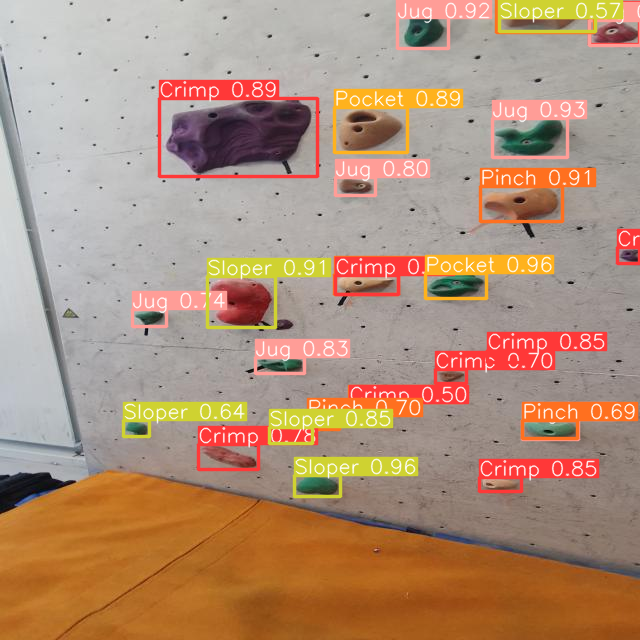

In [10]:
def run_yolo(yolo, image_url, conf=0.25, iou=0.7):
    results = yolo(image_url, conf=conf, iou=iou)
    res = results[0].plot()[:, :, [2,1,0]]
    return Image.fromarray(res)

yolo_augmented_final = YOLO('./runs/detect/train/weights/best.pt')

image_url = './test/images/20231009_132947_jpg.rf.be0ad1a865cb92c1389a0a9922832661.jpg'

#example
run_yolo(yolo_augmented_final, image_url)

In [11]:
#testing dataset
#dunno what is happening
try:
  !curl -L "https://app.roboflow.com/ds/epbGDn7e9u?key=LMgbWRNuJC" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
except Exception as e:
  print(f" This is a silly error: {e}")


 This is a silly error: A UTF-8 locale is required. Got ANSI_X3.4-1968


In [12]:
#manually downloaded the zipfile from roboflow


zip_file_path ='yolo_bound.zip'


extracted_dir = 'other_data'

os.makedirs(extracted_dir, exist_ok=True)

In [13]:
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

In [14]:
path="./other_data/test/images"


image 1/1 /content/other_data/test/images/IMG_2772_jpg.rf.11d41de6052b14c76c7a35a1daa7556d.jpg: 480x640 14 Crimps, 14 Jugs, 2 Pockets, 36 Slopers, 63.5ms
Speed: 3.7ms preprocess, 63.5ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


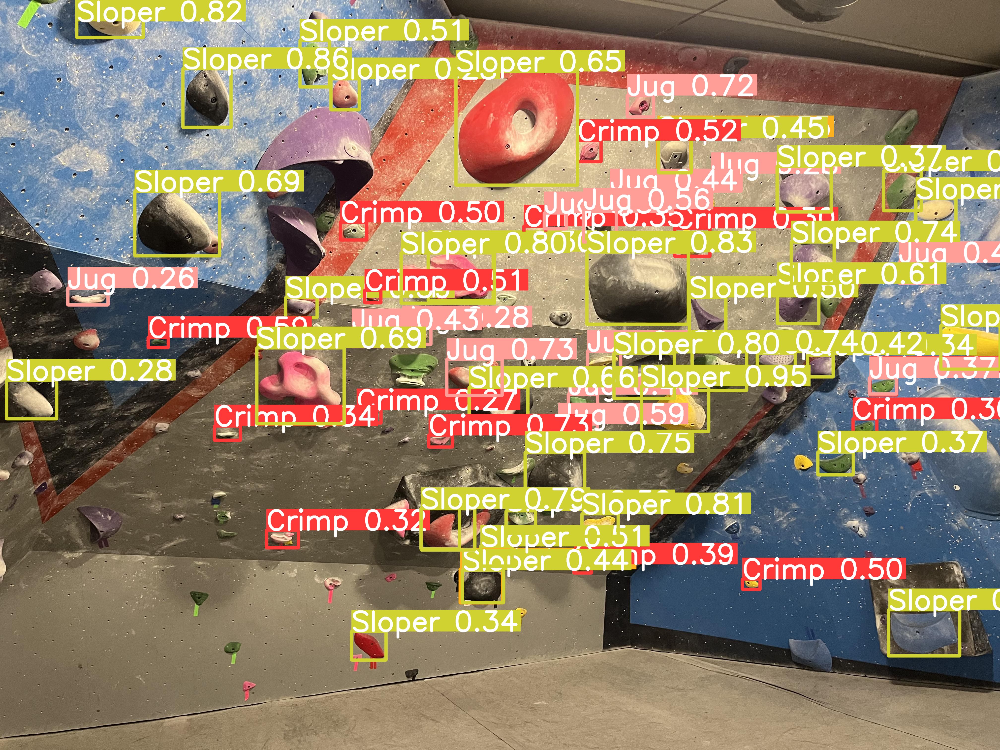

In [15]:
for item in os.listdir(path):
  image_path=path+"/"+item
  results = yolo_augmented_final(image_path, conf=0.25, iou=0.7)
  res = results[0].plot()[:, :, [2,1,0]]
  display(Image.fromarray(res))
  break

Evaluating the performance of the model

In [16]:
class BoundingBox:
    def __init__(self, left, top, right, bottom):
        self.left = left
        self.top = top
        self.right = right
        self.bottom = bottom

In [17]:
def convert_gt_to_xyxy(gt_box):
    x1 = min(gt_box[0], gt_box[2], gt_box[4], gt_box[6])
    y1 = min(gt_box[1], gt_box[3], gt_box[5], gt_box[7])
    x2 = max(gt_box[0], gt_box[2], gt_box[4], gt_box[6])
    y2 = max(gt_box[1], gt_box[3], gt_box[5], gt_box[7])
    return x1, y1, x2, y2

In [18]:
def calculate_iou(box1, box2):
    box2=convert_gt_to_xyxy(box2)
    box2 = BoundingBox(box2[0], box2[1], box2[2], box2[3])
    box1 = BoundingBox(box1[0], box1[1], box1[2], box1[3])


    intersection_width = min(box1.right, box2.right) - max(box1.left, box2.left)
    intersection_height = min(box1.bottom, box2.bottom) - max(box1.top, box2.top)

    if intersection_width <= 0 or intersection_height <= 0:
        return 0

    intersection_area = intersection_width * intersection_height

    box1_area = (box1.right - box1.left) * (box1.bottom - box1.top)
    box2_area = (box2.right - box2.left) * (box2.bottom - box2.top)

    union_area = box1_area + box2_area - intersection_area

    iou = intersection_area / union_area
    return iou

In [19]:
def convert_to_truth(text_input):
  lines = text_input.split('\n')

  bounding_boxes_and_labels = []

  for line in lines:
      if line.strip():
          parts = line.split()
          box = tuple(map(float, parts[:8]))
          label = parts[8]
          confidence = float(parts[9])
          bounding_boxes_and_labels.append({"box": box, "label": label, "confidence": confidence})
  return bounding_boxes_and_labels

In [20]:
def calculate_precision_recall(ground_truth_data, results, iou_threshold=0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    results_boxes = results[0].boxes.data.tolist()
    results_labels = [results[0].names[int(each_score[-1])] for each_score in results_boxes]

    for result in zip(results_boxes, results_labels):
        pred_box, pred_label = result
        pred_box = pred_box[:4]

        match_found = False

        for gt_data in ground_truth_data:
            gt_box = gt_data["box"]
            gt_label = gt_data["label"]

            if pred_label == gt_label and calculate_iou(pred_box, gt_box) > iou_threshold:
                match_found = True
                break

        if match_found:
            true_positives += 1
        else:
            false_positives += 1

    false_negatives = len(ground_truth_data) - true_positives

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

    return precision, recall


In [21]:
img_iterator, img_path = os.listdir("/content/other_data/test/images"), "/content/other_data/test/images"
label_path = "/content/other_data/test/labelTxt"

total_precision, total_recall = 0, 0
for i in range(len(img_iterator)):

  label=label_path+"/"+img_iterator[i][:-3]+"txt"

  with open(label) as f:
    og_labels=f.read()

  ground_truth=convert_to_truth(og_labels)


  image_path=img_path+"/"+img_iterator[i]

  results = yolo_augmented_final(image_path, conf=0.25, iou=0.7)

  total_precision+=calculate_precision_recall(ground_truth, results)[0]
  total_recall+=calculate_precision_recall(ground_truth, results)[1]



image 1/1 /content/other_data/test/images/IMG_2772_jpg.rf.11d41de6052b14c76c7a35a1daa7556d.jpg: 480x640 14 Crimps, 14 Jugs, 2 Pockets, 36 Slopers, 11.4ms
Speed: 4.4ms preprocess, 11.4ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/other_data/test/images/IMG_2727_jpg.rf.06271d1bcc0da6e4e5ca27aeac72a51f.jpg: 480x640 8 Crimps, 32 Jugs, 2 Pinchs, 30 Slopers, 11.1ms
Speed: 5.3ms preprocess, 11.1ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/other_data/test/images/IMG_2769_jpg.rf.e4f77c0c7c26572c08b66f749592ca5c.jpg: 480x640 9 Crimps, 7 Jugs, 3 Pinchs, 1 Pocket, 29 Slopers, 9.8ms
Speed: 4.1ms preprocess, 9.8ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/other_data/test/images/IMG_2773_jpg.rf.36ad78f5be9622a22801c22beb8aa1ac.jpg: 480x640 9 Crimps, 15 Jugs, 4 Pinchs, 3 Pockets, 13 Slopers, 10.0ms
Speed: 4.0ms preprocess, 10.0ms inference, 2.4ms postprocess per image at sha

In [22]:
f"The precision is: {total_precision/12}, the recall is: {total_recall/12} "

'The precision is: 0.1359376347809549, the recall is: 0.20025697600837203 '

In [23]:
f"The F1 score is {2*(total_precision/12*total_recall/12)/(total_precision/12+total_recall/12)} "

'The F1 score is 0.16194465225394833 '